# Data Wrangling 4 - Combining data from all 6 websites

In [456]:
# imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import json


In [457]:
# create a function to open files from json

def load_json(filename):
  with open(filename, 'r') as f:
    data = json.load(f)
  return pd.DataFrame(data)

In [458]:
# load all 6 dataframes

champkoi = load_json('champkoi.json')
gckoi = load_json('gckoi.json')
grandkoi = load_json('grandkoi.json')
kloubec = load_json('kloubec.json')
nextdaykoi = load_json('nextdaykoi.json')
sacramentokoi = load_json('sacramentokoi.json')

In [459]:
# create a function to put df.info into a dataframe

def info_to_df(dataframe, abbreviation):
  # get the datatypes
  dtypes = dataframe.dtypes
  # get the non-null counts
  counts = dataframe.count()
  # create a new dataframe
  return pd.DataFrame({'Columns': dtypes.index, f'Non-Null_{abbreviation}': counts.values})

In [460]:
# create info dfs for all the dataframes

champkoi_info = info_to_df(champkoi, 'champkoi')
gckoi_info = info_to_df(gckoi, 'gckoi')
grandkoi_info = info_to_df(grandkoi, 'grandkoi')
kloubec_info = info_to_df(kloubec, 'kloubec')
nextdaykoi_info = info_to_df(nextdaykoi, 'nextdaykoi')
sacramentokoi_info = info_to_df(sacramentokoi, 'sacramentokoi')


In [461]:
# outer merge all the dataframes together

df = pd.merge(champkoi_info, gckoi_info, on='Columns', how='outer')
df = pd.merge(df, grandkoi_info, on='Columns', how='outer')
df = pd.merge(df, kloubec_info, on='Columns', how='outer')
df = pd.merge(df, nextdaykoi_info, on='Columns', how='outer')
df = pd.merge(df, sacramentokoi_info, on='Columns', how='outer')
df

,Columns,Non-Null_champkoi,Non-Null_gckoi,Non-Null_grandkoi,Non-Null_kloubec,Non-Null_nextdaykoi,Non-Null_sacramentokoi
0,age,NaN,402.0,NaN,NaN,NaN,NaN
1,breeder,35.0,402.0,361.0,NaN,NaN,NaN
2,category,185.0,30.0,NaN,NaN,1948.0,423.0
3,certificate,NaN,402.0,NaN,NaN,NaN,NaN
4,cleaned_strings,185.0,NaN,NaN,NaN,NaN,NaN
5,description,NaN,402.0,NaN,NaN,NaN,NaN
6,details,NaN,NaN,367.0,NaN,NaN,NaN
7,gender,33.0,402.0,NaN,NaN,149.0,156.0
8,gpt_dict,NaN,408.0,NaN,NaN,NaN,NaN
9,image,NaN,NaN,367.0,517.0,1948.0,423.0


In [462]:
# calculate the total number of non-null values for each feature to determine which features have the most data

df['total'] = df.iloc[:, 1:7].sum(axis=1)
df.sort_values(by='total', ascending=False)

,Columns,Non-Null_champkoi,Non-Null_gckoi,Non-Null_grandkoi,Non-Null_kloubec,Non-Null_nextdaykoi,Non-Null_sacramentokoi,total
26,uuid,185.0,408.0,367.0,517.0,1948.0,423.0,3848.0
25,title,185.0,408.0,367.0,517.0,1948.0,423.0,3848.0
15,link,185.0,408.0,367.0,517.0,1948.0,423.0,3848.0
11,image_url,185.0,408.0,367.0,517.0,1948.0,423.0,3848.0
21,tags,185.0,408.0,367.0,517.0,1948.0,422.0,3847.0
18,price,185.0,408.0,346.0,517.0,1948.0,423.0,3827.0
19,sku,185.0,408.0,367.0,517.0,1910.0,422.0,3809.0
14,length_inches,35.0,402.0,361.0,517.0,1903.0,422.0,3640.0
9,image,NaN,NaN,367.0,517.0,1948.0,423.0,3255.0
2,category,185.0,30.0,NaN,NaN,1948.0,423.0,2586.0


To do:
- "image" to "image_path" are the same, rename "image" to "image_path"
- keep multiple_fish, will fill in nulls later by inferring information from other columns (e.g. length is a range)
- in_stock and out_of_stock need to be combined. Convert in_stock to out_of_stock, also check for "SOLD" in tags

In [463]:
# change the index to 'Columns'

df = df.set_index('Columns')

# transpose the df

df.T


Columns,age,breeder,category,certificate,cleaned_strings,description,details,gender,gpt_dict,image,...,price,sku,split,tags,tags_from_category,tags_from_title,tags_list,title,uuid,variety
Non-Null_champkoi,NaN,35.0,185.0,NaN,185.0,NaN,NaN,33.0,NaN,NaN,...,185.0,185.0,185.0,185.0,NaN,NaN,185.0,185.0,185.0,185.0
Non-Null_gckoi,402.0,402.0,30.0,402.0,NaN,402.0,NaN,402.0,408.0,NaN,...,408.0,408.0,NaN,408.0,NaN,NaN,NaN,408.0,408.0,NaN
Non-Null_grandkoi,NaN,361.0,NaN,NaN,NaN,NaN,367.0,NaN,NaN,367.0,...,346.0,367.0,NaN,367.0,NaN,NaN,NaN,367.0,367.0,NaN
Non-Null_kloubec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,517.0,...,517.0,517.0,NaN,517.0,NaN,NaN,NaN,517.0,517.0,NaN
Non-Null_nextdaykoi,NaN,NaN,1948.0,NaN,NaN,NaN,NaN,149.0,NaN,1948.0,...,1948.0,1910.0,NaN,1948.0,1948.0,1948.0,NaN,1948.0,1948.0,NaN
Non-Null_sacramentokoi,NaN,NaN,423.0,NaN,NaN,NaN,NaN,156.0,NaN,423.0,...,423.0,422.0,NaN,422.0,423.0,422.0,NaN,423.0,423.0,NaN
total,402.0,798.0,2586.0,402.0,185.0,402.0,367.0,740.0,408.0,3255.0,...,3827.0,3809.0,185.0,3847.0,2371.0,2370.0,185.0,3848.0,3848.0,185.0


In [464]:
# check the transposed df for nulls

df.T.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7 entries, Non-Null_champkoi to total
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 2 non-null      float64
 1   breeder             4 non-null      float64
 2   category            5 non-null      float64
 3   certificate         2 non-null      float64
 4   cleaned_strings     2 non-null      float64
 5   description         2 non-null      float64
 6   details             2 non-null      float64
 7   gender              5 non-null      float64
 8   gpt_dict            2 non-null      float64
 9   image               5 non-null      float64
 10  image_path          3 non-null      float64
 11  image_url           7 non-null      float64
 12  in_stock            3 non-null      float64
 13  length_cm           2 non-null      float64
 14  length_inches       7 non-null      float64
 15  link                7 non-null      float64
 1

### Data Cleaning

In [465]:
# "image" to "image_path" are the same, rename "image" to "image_path"

grandkoi = grandkoi.rename(columns={"image": "image_path"})
kloubec = kloubec.rename(columns={"image": "image_path"})
nextdaykoi = nextdaykoi.rename(columns={"image": "image_path"})
sacramentokoi = sacramentokoi.rename(columns={"image": "image_path"})

In [466]:
# in_stock and out_of_stock need to be combined. Convert in_stock to out_of_stock
# datasets with "in-stock": champkoi, gckoi

champkoi['out_of_stock'] = ~champkoi['in_stock']
gckoi['out_of_stock'] = ~gckoi['in_stock']


In [467]:
# grandkoi title contain the word "SOLD", which can indicate out_of_stock
# create a function to create a new column of out_of_stock based on whether or not the title contains the word 'sold'

def check_sold(string):
  return 'sold' in map(str.lower, string.split())

In [468]:
# test the function

check_sold(grandkoi['title'][0])

True

In [469]:
# apply the function to the entire grandkoi dataset to create a new column out_of_stock

grandkoi['out_of_stock'] = grandkoi['title'].apply(check_sold)
grandkoi['out_of_stock']

0       True
1       True
2       True
3      False
4       True
       ...  
362    False
363    False
364    False
365    False
366    False
Name: out_of_stock, Length: 367, dtype: bool

In [470]:
# check the value counts of the new column

grandkoi['out_of_stock'].value_counts()

out_of_stock
False    343
True      24
Name: count, dtype: int64

In [471]:
# keep multiple_fish, will fill in nulls later by inferring information from other columns (e.g. length is a range)
# datasets that currently do not have "multiple_fish" feature: champkoi, grandkoi, kloubec, nextdaykoi, sacramentokoi

In [472]:
# 1. check champkoi for ways to tell multiple_fish
# check category feature

champkoi['category'].value_counts()

category
Single_Koi     126
Group_Koi       32
Presale_Koi     27
Name: count, dtype: int64

e1bc4e
A: 20-22" (50-55cm) Female Showa [Ogata] — 2024FALL-103


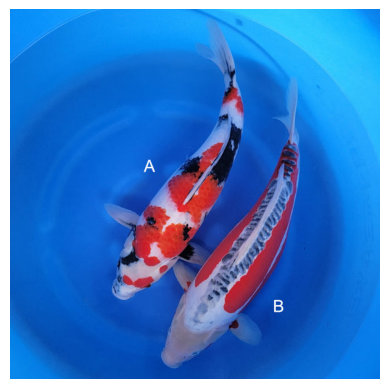

c7f865
Default Title — 2024FALL-159 Showa


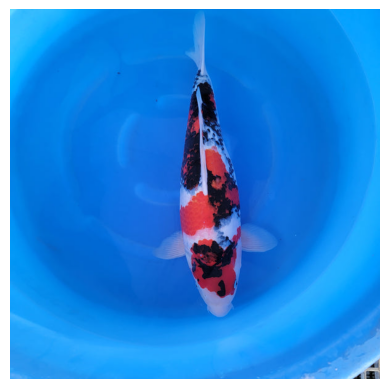

4024a4
Default Title — 2024FALL-029 Ginrin Kohaku


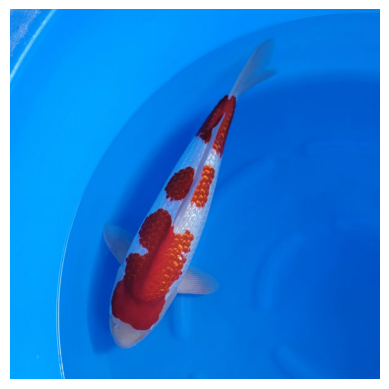

006254
Default Title — 2024FALL-081 Yellow Kogane Ochiba


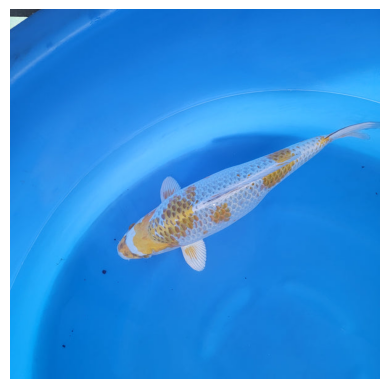

4a5e3b
Default Title — 2024FALL-158 Showa


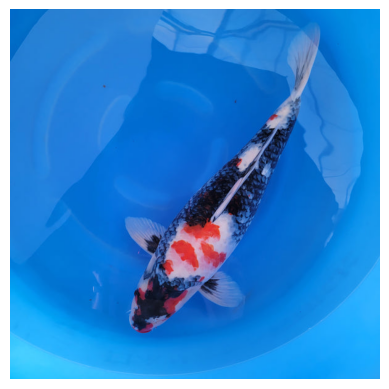

27bf81
Default Title — 2024FALL-069 Karasu


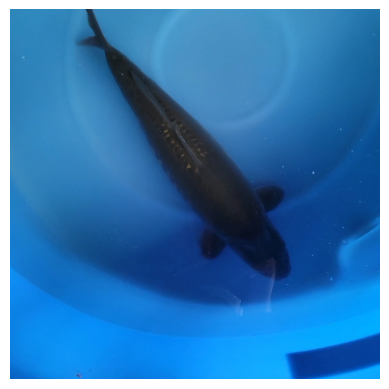

e61ebb
Default Title — 2024FALL-106 Doitsu Kujaku


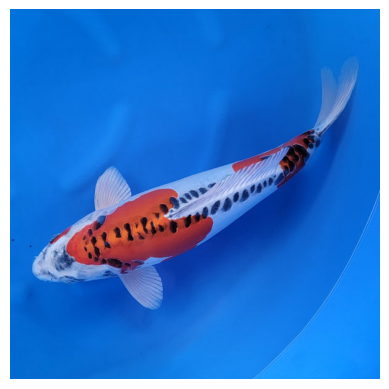

459f4d
A: 22" (55cm) Female Sanke [Ogata] — 2024FALL-109


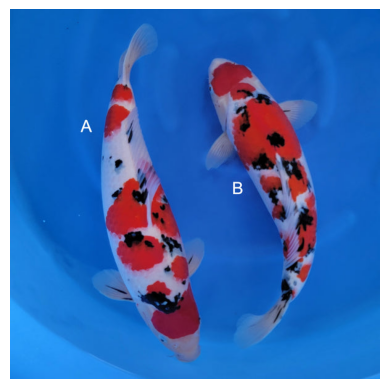

5192d9
Default Title — 2024FALL-005 Platinum Ogon


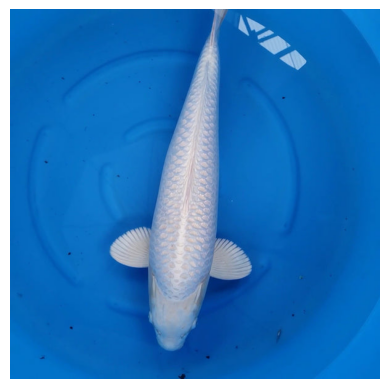

7dccea
Default Title — 2024FALL-006 Platinum Ogon


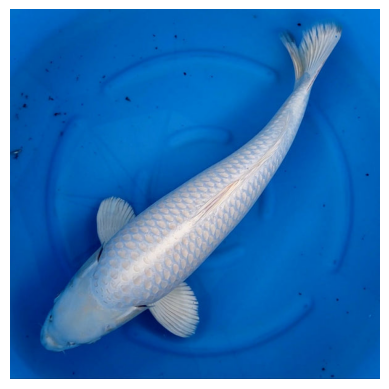

b6a844
Default Title — 2024FALL-141 Showa


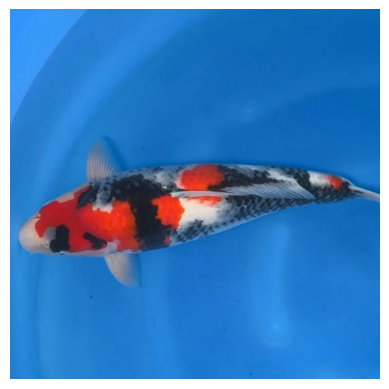

fc900e
Default Title — 2024FALL-143 Aragoke


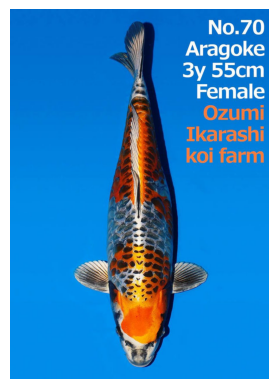

20d34c
Default Title — 2024FALL-144 Showa


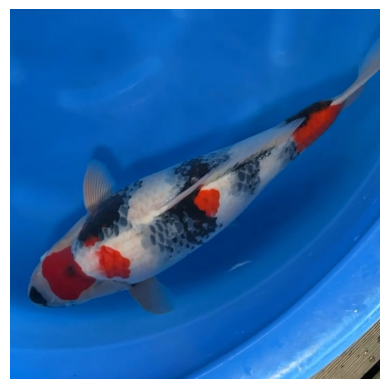

6d4ada
Default Title — 2024FALL-175 Shusui


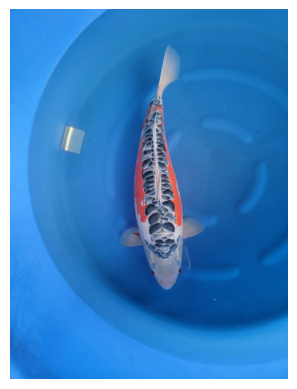

21edf2
Default Title — 2024FALL-020 Chagoi


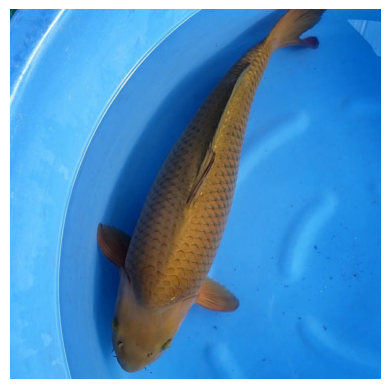

1492a7
Default Title — 2024FALL-154 Kohaku


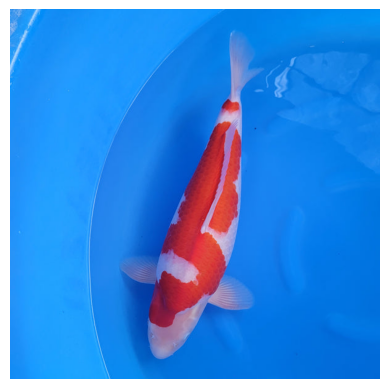

4fb403
Default Title — 2024FALL-155 Kohaku


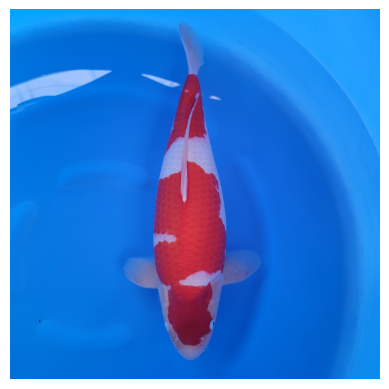

0d95f1
Default Title — 2024FALL-007 Doitsu Showa


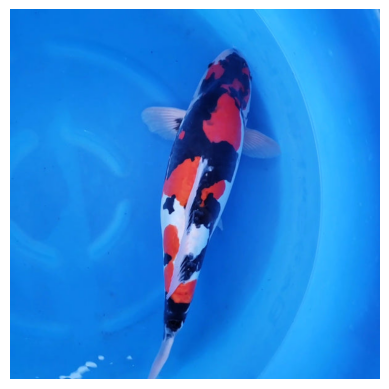

cee61a
Default Title — 2024FALL-028 Ginrin Kohaku


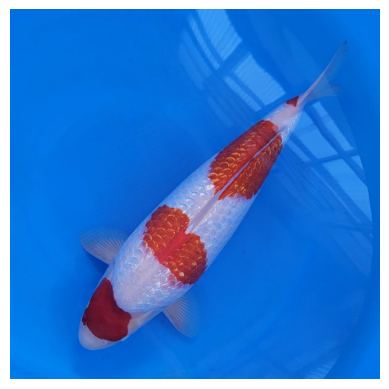

dd2d88
Default Title — 2024FALL-073 Kin Showa


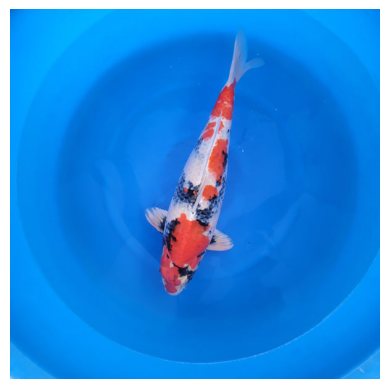

173685
Default Title — 2024FALL-166 Kogane Ochiba


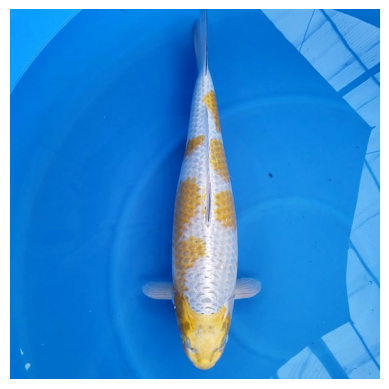

112c44
Default Title — 2024FALL-178 Kumonryu


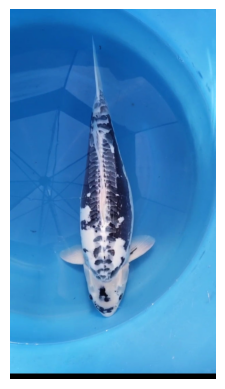

8739ef
Default Title — 2024FALL-188 Showa


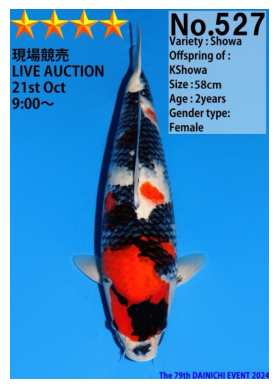

b6f815
Default Title — 2024FALL-189 Showa


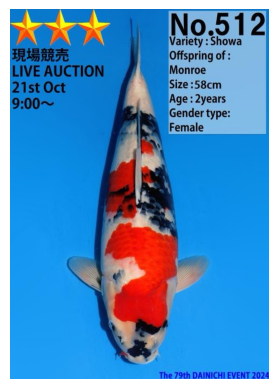

79245b
Default Title — 2024FALL-080 Mukashi Ogon


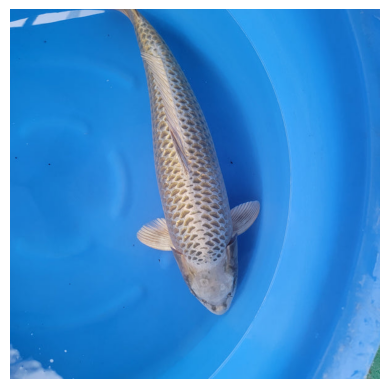

18f755
A: 32" Female Kohaku [Nogami] — 2023FALL-109


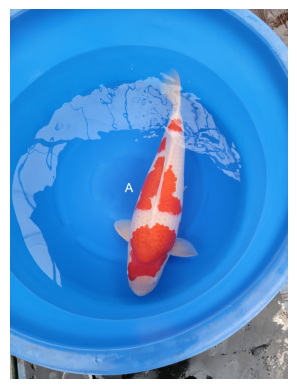

52e490
Default Title — 2024FALL-127 Yellow Mukashi Ogon


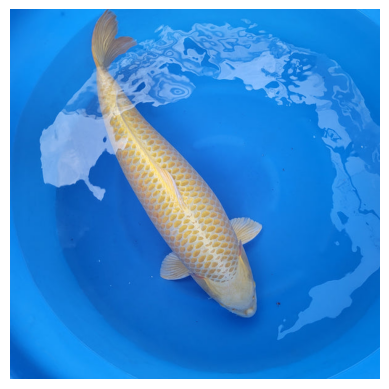

In [473]:
# check if presale_koi is single or multiple

for index, row in champkoi[champkoi['category'] == 'Presale_Koi'].iterrows():
  print(row['uuid'])
  print(row['title'])
  img_path = '../pictures/' + row['image_path']
  img = mpimg.imread(img_path)
  plt.imshow(img)
  plt.axis('off')
  plt.show()

 - manual inspection shows that uuid = e1bc4e, 459f4d contain multiple fish
 - another option I have is to train a model to detect if the picture contains 1 fish, or not. At the moment, the visual inspection was able to address this issue efficiently. If this proves to be a more persistent issue later, I may consider training a model for this purpose.

In [474]:
# create a function to create a new multiple_fish feature in champkoi
# if category is Single_Koi, then False
# if category is Group_Koi, then True
# if category is Presale_Koi, then False unless the uuid is in [e1bc4e, 459f4d]

def champkoi_multiple_fish(row):
  if row['category'] == 'Single_Koi':
     return False
  elif row['category'] == 'Group_Koi':
    return True
  elif row['uuid'] in ['e1bc4e', '459f4d']:
    return True
  else:
    return False

In [475]:
# apply the function to the whole dataframe

champkoi['multiple_fish'] = champkoi.apply(champkoi_multiple_fish, axis=1)

In [476]:
# check the updated dataframe

champkoi.head()

,uuid,sku,variety,title,price,in_stock,link,category,tags,image_url,image_path,split,cleaned_strings,length_cm,length_inches,gender,breeder,tags_list,out_of_stock,multiple_fish
0,87e22e,9689837273400,"A: 14"" (36cm) Female Showa [Isa]","A: 14"" (36cm) Female Showa [Isa] — 2025WINTER-012",450.0,False,https://www.champkoi.com/products/2025winter-012,Group_Koi,['Showa'],https://cdn.shopify.com/s/files/1/0749/6132/22...,champkoi_data/87e22e_A_14_(36cm)_Female_Showa_...,"[A:, 14"", (36cm), Female, Showa, [Isa], —, 202...","[14"", (36cm), Female, Showa, [Isa], 2025WINTER...",36cm,"14""",Female,Isa,[Showa],True,True
1,188b5a,9689846350136,"A: 14"" (36cm) Male Showa [Isa]","A: 14"" (36cm) Male Showa [Isa] — 2025WINTER-014",450.0,True,https://www.champkoi.com/products/2025winter-014,Group_Koi,['Showa'],https://cdn.shopify.com/s/files/1/0749/6132/22...,champkoi_data/188b5a_A_14_(36cm)_Male_Showa_[I...,"[A:, 14"", (36cm), Male, Showa, [Isa], —, 2025W...","[14"", (36cm), Male, Showa, [Isa], 2025WINTER-014]",36cm,"14""",Male,Isa,[Showa],False,True
2,911317,9689850118456,"A: 13"" (33cm) Male Showa [Isa]","A: 13"" (33cm) Male Showa [Isa] — 2025WINTER-015",450.0,True,https://www.champkoi.com/products/2025winter-015,Group_Koi,['Showa'],https://cdn.shopify.com/s/files/1/0749/6132/22...,champkoi_data/911317_A_13_(33cm)_Male_Showa_[I...,"[A:, 13"", (33cm), Male, Showa, [Isa], —, 2025W...","[13"", (33cm), Male, Showa, [Isa], 2025WINTER-015]",33cm,"13""",Male,Isa,[Showa],False,True
3,dd27e7,9689853329720,"A: 14"" (36cm) Female Showa [Isa]","A: 14"" (36cm) Female Showa [Isa] — 2025WINTER-016",450.0,False,https://www.champkoi.com/products/2025winter-016,Group_Koi,['Showa'],https://cdn.shopify.com/s/files/1/0749/6132/22...,champkoi_data/dd27e7_A_14_(36cm)_Female_Showa_...,"[A:, 14"", (36cm), Female, Showa, [Isa], —, 202...","[14"", (36cm), Female, Showa, [Isa], 2025WINTER...",36cm,"14""",Female,Isa,[Showa],True,True
4,de2cb4,9689970475320,"A: 14"" (36cm) Male Kohaku [Marusaka]","A: 14"" (36cm) Male Kohaku [Marusaka] — 2025WIN...",450.0,False,https://www.champkoi.com/products/2025winter-017,Group_Koi,"['Kohaku', 'Shiro Utsuri', 'Shusui']",https://cdn.shopify.com/s/files/1/0749/6132/22...,champkoi_data/de2cb4_A_14_(36cm)_Male_Kohaku_[...,"[A:, 14"", (36cm), Male, Kohaku, [Marusaka], —,...","[14"", (36cm), Male, Kohaku, [Marusaka], 2025WI...",36cm,"14""",Male,Marusaka,"[Kohaku, Shiro Utsuri, Shusui]",True,True


87e22e
A: 14" (36cm) Female Showa [Isa] — 2025WINTER-012
True


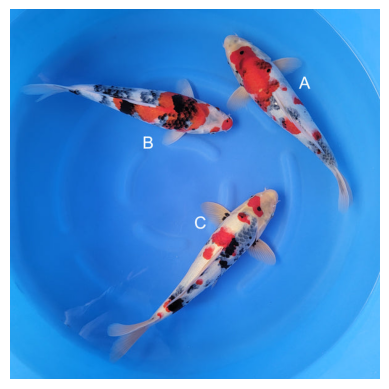

188b5a
A: 14" (36cm) Male Showa [Isa] — 2025WINTER-014
True


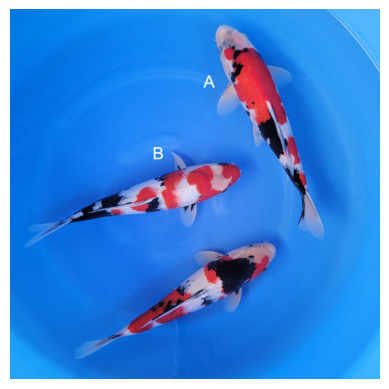

911317
A: 13" (33cm) Male Showa [Isa] — 2025WINTER-015
True


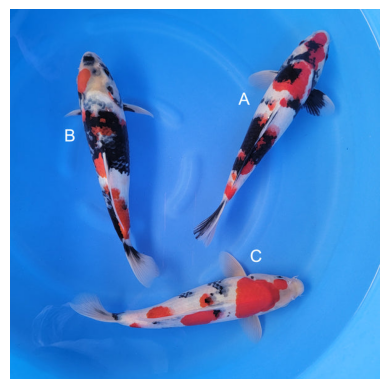

dd27e7
A: 14" (36cm) Female Showa [Isa] — 2025WINTER-016
True


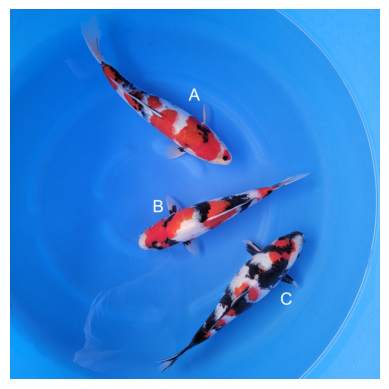

de2cb4
A: 14" (36cm) Male Kohaku [Marusaka] — 2025WINTER-017
True


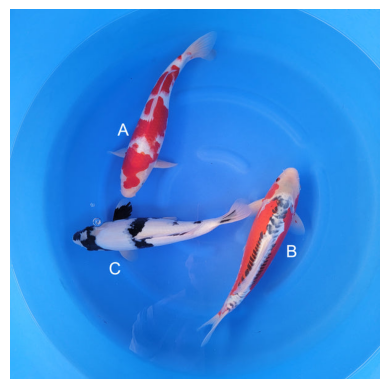

14bfe4
A: 13" (33cm) Male Beni Kikokuryu [Marusaka] — 2025WINTER-018
True


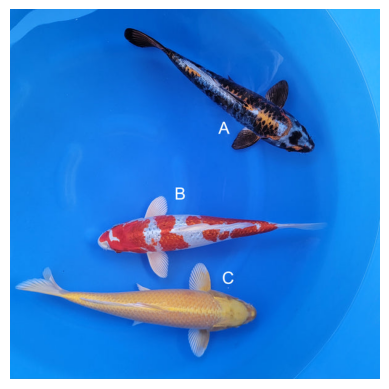

a693e1
A: 13" (33cm) Female Golden Corn [Taniguchi] — 2025WINTER-019
True


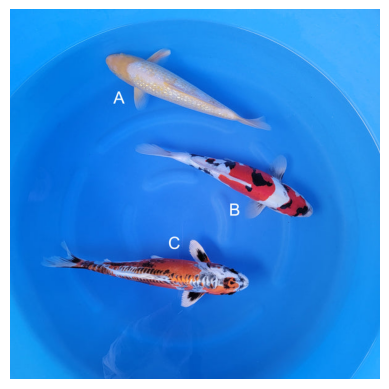

a7584e
A: 14" (36cm) Male Doitsu Showa [Marusaka] — 2025WINTER-021
True


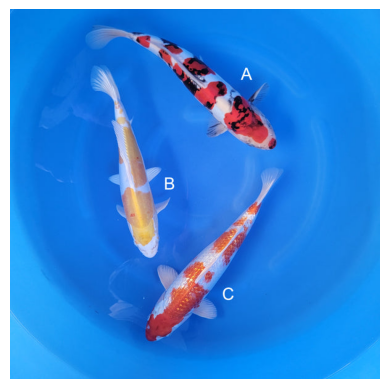

9e58fa
A: 15" (38cm) Female Hi Utsuri [Maruhiro] — 2025WINTER-022
True


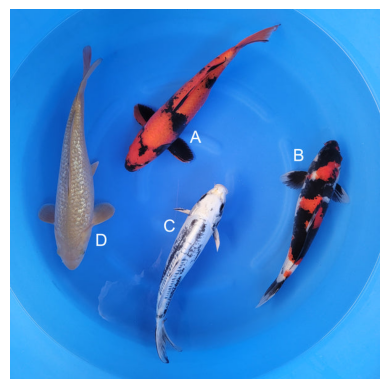

228287
A: 14-15" (36-38cm) Karasugoi [Marusho] — 2025WINTER-024
True


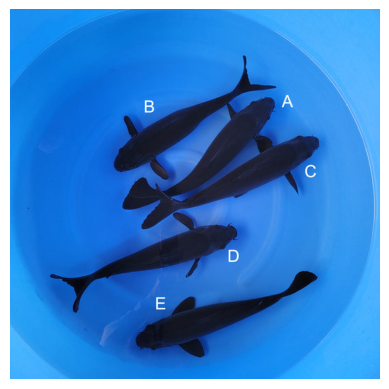

In [477]:
# stop check the first 10 fish in the dataset

for index, row in champkoi.head(10).iterrows():
  print(row['uuid'])
  print(row['title'])
  print(row['multiple_fish'])
  img_path = '../pictures/' + row['image_path']
  img = mpimg.imread(img_path)
  plt.imshow(img)
  plt.axis('off')
  plt.show()

### Datasets that still do not have "multiple_fish" feature: grandkoi, kloubec, nextdaykoi, sacramentokoi

In [478]:
# check the grandkoi dataframe for ways to determine multiple_fish
# check to see if length_inches is ever a range, which could indicate that there is more than 1 fish

grandkoi['length_inches'].value_counts()

length_inches
30.0    30
25.0    29
26.0    28
28.0    27
29.0    25
27.0    25
24.0    22
31.0    19
17.0    19
22.0    18
21.0    14
19.0    14
18.0    13
23.0    13
20.0    11
33.0    11
16.0    11
32.0    11
34.0    10
35.0     4
15.0     3
36.0     2
38.0     1
37.0     1
Name: count, dtype: int64

In [479]:
# check for nan's

grandkoi['length_inches'].isna().sum()

np.int64(6)

In [480]:
# check the nan's

grandkoi[grandkoi['length_inches'].isna()]

,uuid,link,title,price,sku,details,image_path,image_url,breeder,length_inches,tags,out_of_stock
107,62eb6c,https://www.grandkoi.com/product/benigoi-7092/,Benigoi,"$2,999.00",7092,"['Breeder: Maruhiro', 'Inches:']",grandkoi_data/62eb6c_Benigoi.jpeg,https://www.grandkoi.com/wp-content/uploads/20...,Maruhiro,NaN,[Benigoi],False
258,7b1ffb,https://www.grandkoi.com/product/gin-rin-showa...,Gin Rin Showa,"$2,499.00",6805,"['Breeder: Shinoda', 'Inches:']",grandkoi_data/7b1ffb_Gin Rin Showa.jpg,https://www.grandkoi.com/wp-content/uploads/20...,Shinoda,NaN,"[Gin, Rin, Showa]",False
288,e95b9b,https://www.grandkoi.com/product/nijikawa-grow...,Nijikawa Growth Float 5MM/40 lbs,$240.00,B1010,"['Breeder:', 'Inches:']",grandkoi_data/e95b9b_Nijikawa Growth Float 5MM...,https://www.grandkoi.com/wp-content/uploads/20...,NaN,NaN,"[Nijikawa, Growth, Float, 5MM/40, lbs]",False
289,fdee49,https://www.grandkoi.com/product/nijikawa-growth/,Nijikawa Growth Float 7MM/40 lbs,$240.00,B1002,"['Breeder:', 'Inches:']",grandkoi_data/fdee49_Nijikawa Growth Float 7MM...,https://www.grandkoi.com/wp-content/uploads/20...,NaN,NaN,"[Nijikawa, Growth, Float, 7MM/40, lbs]",False
290,2aff66,https://www.grandkoi.com/product/nijikawa-colo...,Nijikawa Color Genesis-Float 7MM 40 lbs,$225.00,B1003,"['Breeder:', 'Inches:']",grandkoi_data/2aff66_Nijikawa Color Genesis-Fl...,https://www.grandkoi.com/wp-content/uploads/20...,NaN,NaN,"[Nijikawa, Color, Genesis-Float, 7MM, 40, lbs]",False
358,f3d94b,https://www.grandkoi.com/product/nijikawa-colo...,Nijikawa Color Genesis- Sinking 5MM pellet-44 lbs,$250.00,B1005,"['Breeder:', 'Inches:']",grandkoi_data/f3d94b_Nijikawa Color Genesis- S...,https://www.grandkoi.com/wp-content/uploads/wo...,NaN,NaN,"[Nijikawa, Color, Genesis, Sinking, 5MM, pelle...",False


Benigoi
62eb6c


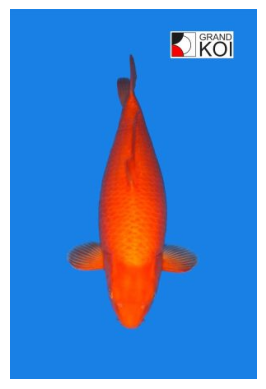

Gin Rin Showa
7b1ffb


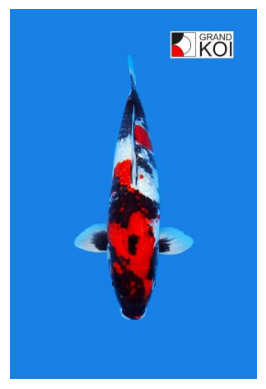

Nijikawa Growth Float 5MM/40 lbs
e95b9b


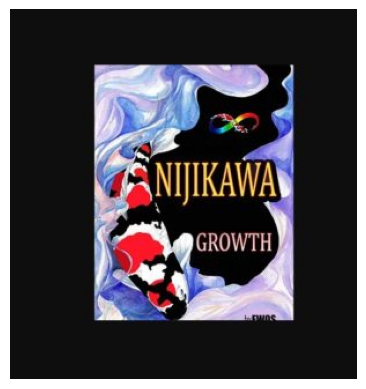

Nijikawa Growth Float 7MM/40 lbs
fdee49


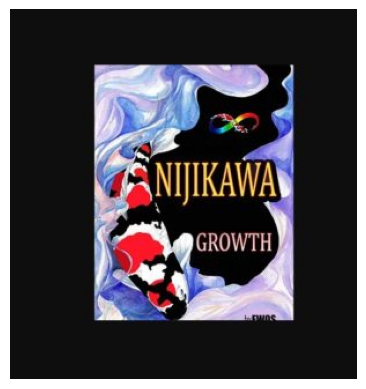

Nijikawa Color Genesis-Float 7MM 40 lbs
2aff66


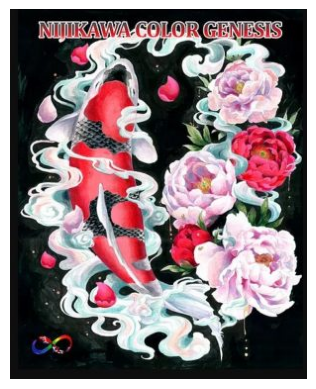

Nijikawa Color Genesis- Sinking 5MM pellet-44 lbs
f3d94b


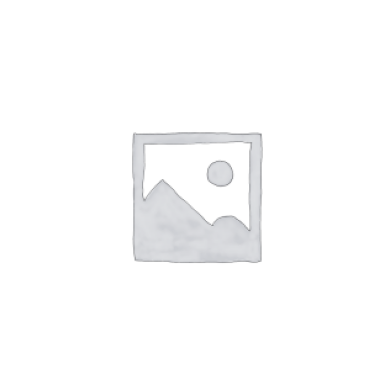

In [481]:
# check the pictures of the observations that have nan's in length_inches

for index, row in grandkoi[grandkoi['length_inches'].isna()].iterrows():
  image_path = '../pictures/' + row['image_path']
  img = mpimg.imread(image_path)
  plt.imshow(img)
  print(row['title'])
  print(row['uuid'])
  plt.axis('off')
  plt.show()

- it looks like some of the ones with nan in length_inches are actually not fish, these should be removed from the dataset

In [482]:
# drop the non-fish rows,

drop_uuid = ['e95b9b', 'fdee49', '2aff66', 'f3d94b']

grandkoi = grandkoi[~grandkoi['uuid'].isin(drop_uuid)]

In [483]:
# double check

grandkoi[grandkoi['uuid'] == 'e95b9b']

,uuid,link,title,price,sku,details,image_path,image_url,breeder,length_inches,tags,out_of_stock


In [484]:
# all remaining observations in grandkoi are of single fish
# this is confirmed by a visual inspection of the picture in a file folder
# create a new feature for "multiple_fish", with False for all rows in grandkoi

grandkoi['multiple_fish'] = False
grandkoi.head()

,uuid,link,title,price,sku,details,image_path,image_url,breeder,length_inches,tags,out_of_stock,multiple_fish
0,d7c302,https://www.grandkoi.com/product/high-quality-...,High Quality showa- SOLD,NaN,8098,['Breeder: Sakai<br>Inches: 30</br>'],grandkoi_data/d7c302_High Quality showa- SOLD....,https://www.grandkoi.com/wp-content/uploads/20...,Sakai,30.0,[showa],True,False
1,12a49e,https://www.grandkoi.com/product/gin-rin-showa...,High Quality Gin Rin Showa- SOLD,"$34,999.00",8097,['Breeder: Sakai<br>Inches: 32</br>'],grandkoi_data/12a49e_High Quality Gin Rin Show...,https://www.grandkoi.com/wp-content/uploads/20...,Sakai,32.0,"[Gin, Rin, Showa]",True,False
2,9ac3a8,https://www.grandkoi.com/product/high-quality-...,High Quality Gin Rin showa- SOLD,"$34,999.00",8096,['Breeder: Sakai<br>Inches: 32</br>'],grandkoi_data/9ac3a8_High Quality Gin Rin show...,https://www.grandkoi.com/wp-content/uploads/20...,Sakai,32.0,"[Gin, Rin, showa]",True,False
3,adf84d,https://www.grandkoi.com/product/karashigoi-8092/,Karashigoi,"$32,999.00",8092,"['Breeder: Dainichi', 'Inches: 36']",grandkoi_data/adf84d_Karashigoi.jpeg,https://www.grandkoi.com/wp-content/uploads/20...,Dainichi,36.0,[Karashigoi],False,False
4,a0b886,https://www.grandkoi.com/product/doitsu-kogane...,Doitsu Kogane Ochiba- SOLD,"$24,999.00",8091,"['Breeder: Marusei', 'Inches: 31']",grandkoi_data/a0b886_Doitsu Kogane Ochiba- SOL...,https://www.grandkoi.com/wp-content/uploads/20...,Marusei,31.0,"[Doitsu, Kogane, Ochiba]",True,False


### Datasets that still do not have "multiple_fish" feature: kloubec, nextdaykoi, sacramentokoi

In [485]:
# check kloubec dataframe for ways to determine multiple fish

kloubec

,uuid,link,title,price,sku,image_path,image_url,length_inches,tags
0,e66d83,https://www.kloubeckoi.com/10-12-showacase-sho...,"10-12"" ""Showacase"" Showa Koi #K5430(X50)",1599.99,22874,kloubec_data/e66d83_10-12_Showacase_Showa_Koi_...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"10-12""",[Showa]
1,7150be,https://www.kloubeckoi.com/14-doitsu-yamato-ni...,"14"" Doitsu Yamato Nishiki Koi #K5429(P2)",299.99,22873,kloubec_data/7150be_14_Doitsu_Yamato_Nishiki_K...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"14""","[Doitsu, Yamato, Nishiki]"
2,7ef4a6,https://www.kloubeckoi.com/11-kin-ki-utsuri-bu...,"11"" Kin Ki Utsuri Butterfly Koi #K5427(X15)",299.99,22872,kloubec_data/7ef4a6_11_Kin_Ki_Utsuri_Butterfly...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"11""","[Kin, Ki, Utsuri, Butterfly]"
3,c52abb,https://www.kloubeckoi.com/13-chagoi-butterfly...,"13"" Chagoi Butterfly Koi #K5426(X15)",299.99,22871,kloubec_data/c52abb_13_Chagoi_Butterfly_Koi_#K...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"13""","[Chagoi, Butterfly]"
4,f54b07,https://www.kloubeckoi.com/12-skye-butterfly-k...,"12"" ""Skye"" Butterfly Koi #K5425(X15)",299.99,22870,kloubec_data/f54b07_12_Skye_Butterfly_Koi_#K54...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"12""",[Butterfly]
...,...,...,...,...,...,...,...,...,...
512,41ea30,https://www.kloubeckoi.com/14-kikokuryu-koi-k1...,"14"" Kikokuryu Koi (#K12514U3)",469.99,19491,kloubec_data/41ea30_14_Kikokuryu_Koi_(#K12514U...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"14""",[Kikokuryu]
513,f5adfb,https://www.kloubeckoi.com/13-ogon-koi-l9099u6/,"13"" Ogon Koi (#L9099U6)",369.99,19446,kloubec_data/f5adfb_13_Ogon_Koi__(#L9099U6).jpg,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"13""",[Ogon]
514,e99ac2,https://www.kloubeckoi.com/10-5-gin-rin-showa-...,"10.5"" Gin Rin Showa Koi #K1222(X35)",199.99,19407,kloubec_data/e99ac2_10.5_Gin_Rin_Showa_Koi_#K1...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"10.5""","[Gin, Rin, Showa]"
515,7bc647,https://www.kloubeckoi.com/11-tancho-showa-koi...,"11"" Tancho Showa Koi #J1157(X35)",499.99,19399,kloubec_data/7bc647_11_Tancho_Showa_Koi_#J1157...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"11""","[Tancho, Showa]"


In [486]:
# check the length value counts

kloubec['length_inches'].value_counts()

length_inches
13"       43
10"       43
12"       40
11"       37
15"       30
14"       28
10.5"     25
8"        23
7"        22
16"       21
11.5"     18
12.5"     18
17"       17
9"        15
8.5"      14
5-6"      14
7.5"      14
6.5"      11
9.5"      11
13.5"     10
6"        10
18"        6
19"        5
14.5"      5
8-10"      4
5.5"       4
15.5"      4
16.5"      3
6-8"       3
5"         3
20"        3
19.5"      2
17.5"      2
23"        1
7-8"       1
10.5       1
10-12"     1
21"        1
13.5""     1
6-7"       1
4-5"       1
22"        1
Name: count, dtype: int64

- If the length is a range, it is highly likely that it is referring to more than 1 fish

In [487]:
# visually examine pictures where the length_inches contain "-" to indicate a range

kloubec[kloubec['length_inches'].str.contains('-')]

,uuid,link,title,price,sku,image_path,image_url,length_inches,tags
0,e66d83,https://www.kloubeckoi.com/10-12-showacase-sho...,"10-12"" ""Showacase"" Showa Koi #K5430(X50)",1599.99,22874,kloubec_data/e66d83_10-12_Showacase_Showa_Koi_...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"10-12""",[Showa]
29,af201b,https://www.kloubeckoi.com/10-4-5-pond-pack-ko...,"(10) 4-5"" Pond Pack Koi #L3847(G10)",399.99,22826,kloubec_data/af201b_(10)_4-5_Pond_Pack_Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"4-5""","[Pond, Pack]"
30,99b221,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3833(G8)",249.99,22824,kloubec_data/99b221_(5)_5-6_Pond_Pack_Koi_#L38...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
32,2fb1f7,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3807(G3)",249.99,22819,kloubec_data/2fb1f7_(5)_5-6_Pond_Pack_Koi_#L38...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
48,37c2a8,https://www.kloubeckoi.com/3-5-6-best-buds-hik...,"(3) 5-6"" ""Best Buds"" Hikari Koi Pond Pack #J41...",249.99,22764,kloubec_data/37c2a8_(3)_5-6_Best_Buds_Hikari_K...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Buds"", Hikari, Pond, Pack]"
51,420d00,https://www.kloubeckoi.com/3-6-8-fab-three-koi...,"(3) 6-8"" ""Fab Three"" Koi Pond Pack #J4185(J1)",349.99,22758,kloubec_data/420d00_(3)_6-8_Fab_Three_Koi_Pond...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"6-8""","[Three"", Pond, Pack]"
156,fdd2b2,https://www.kloubeckoi.com/10-5-6-pond-pack-ko...,"(10) 5-6"" Pond Pack Koi #L3615(H11)",399.99,22538,kloubec_data/fdd2b2_(10)_5-6_Pond_Pack__Koi_#L...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
157,f2704a,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3595(H8)",249.99,22535,kloubec_data/f2704a_(5)_5-6_Pond_Pack__Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
158,5f8152,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3587(H6)",249.99,22533,kloubec_data/5f8152_(5)_5-6_Pond_Pack__Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
159,89483e,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3572(H3)",249.99,22530,kloubec_data/89483e_(5)_5-6_Pond_Pack__Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"


10-12" "Showacase" Showa Koi #K5430(X50)
e66d83
10-12"


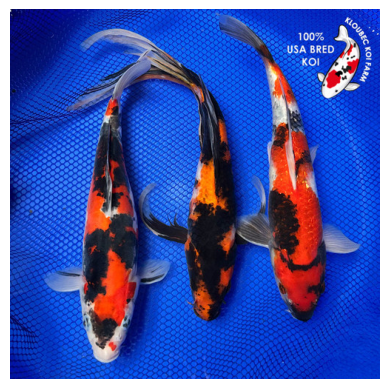

(10) 4-5" Pond Pack Koi #L3847(G10)
af201b
4-5"


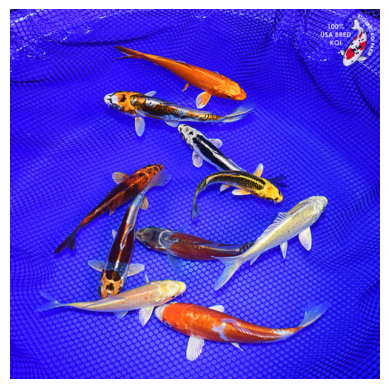

(5) 5-6" Pond Pack Koi #L3833(G8)
99b221
5-6"


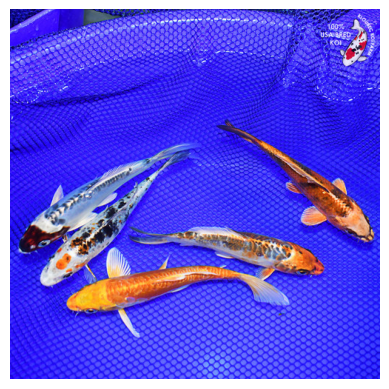

(5) 5-6" Pond Pack Koi #L3807(G3)
2fb1f7
5-6"


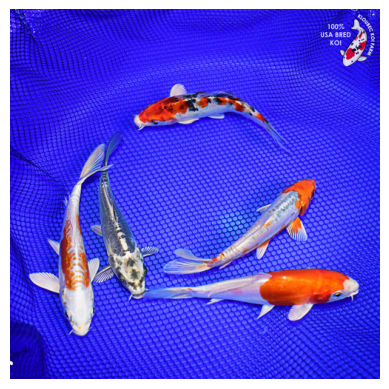

(3) 5-6" "Best Buds" Hikari Koi Pond Pack #J4187(J4)
37c2a8
5-6"


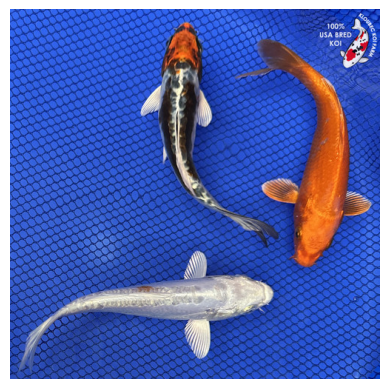

(3) 6-8" "Fab Three" Koi Pond Pack #J4185(J1)
420d00
6-8"


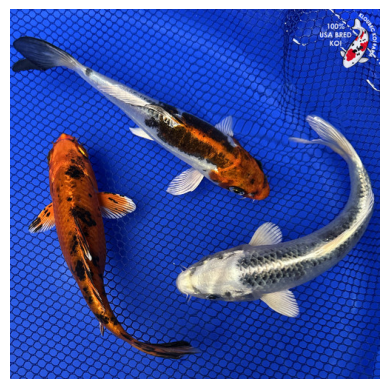

(10) 5-6" Pond Pack  Koi #L3615(H11)
fdd2b2
5-6"


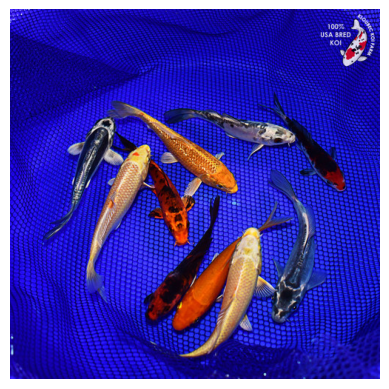

(5) 5-6" Pond Pack  Koi #L3595(H8)
f2704a
5-6"


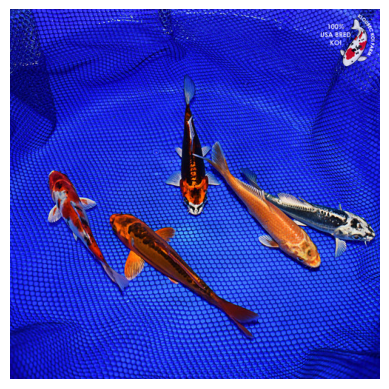

(5) 5-6" Pond Pack  Koi #L3587(H6)
5f8152
5-6"


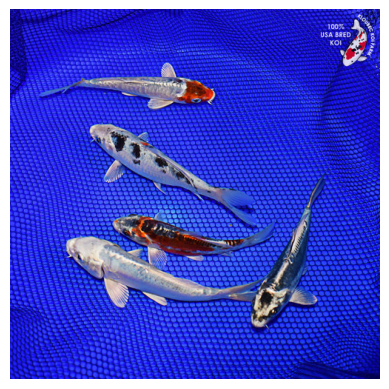

(5) 5-6" Pond Pack  Koi #L3572(H3)
89483e
5-6"


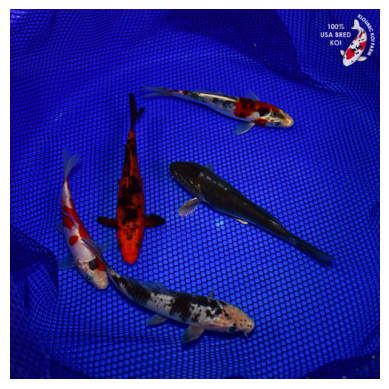

(5) 5-6" Pond Pack  Koi #L3563(H1)
19428a
5-6"


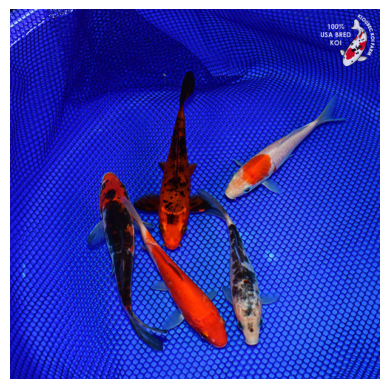

(5) 6-7" Pond Pack Butterfly Koi #L3543(K2)
ad5b8d
6-7"


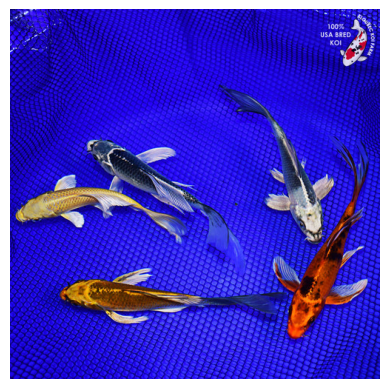

(5) 5-6" Pond Pack Butterfly Koi #L3530(J10)
f863d7
5-6"


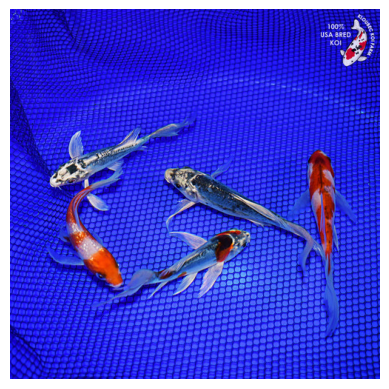

(5) 5-6" Pond Pack  Koi #L3512(J6)
3c41cc
5-6"


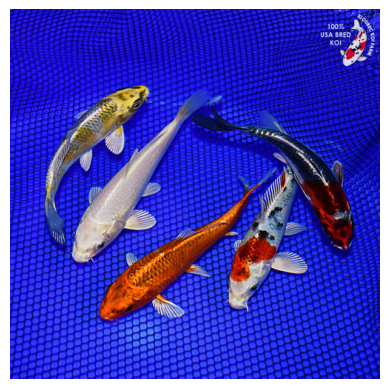

(5) 5-6" Pond Pack  Koi #L3509(J5)
cb0801
5-6"


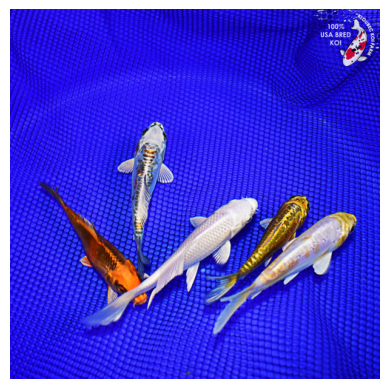

(5) 5-6" Pond Pack  Koi #L3493(J3)
6f7047
5-6"


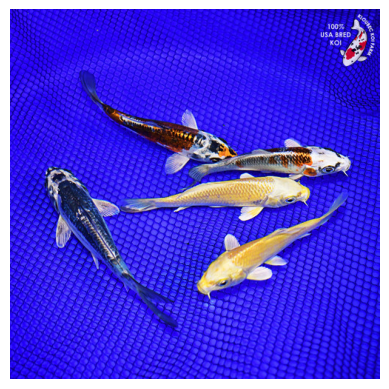

(5) 7-8" Butterfly Koi Pond Pack #L2924(X39)
c76d1e
7-8"


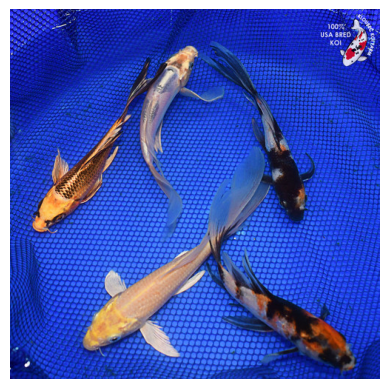

(3) 8-10" Butterfly Koi Pond Pack #L2899(X34)
f991ea
8-10"


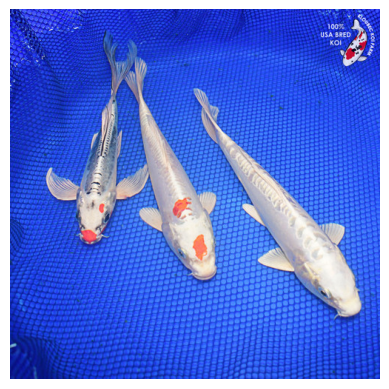

(20) 5-6" Koi Pond Pack #L2892(X31)
7112be
5-6"


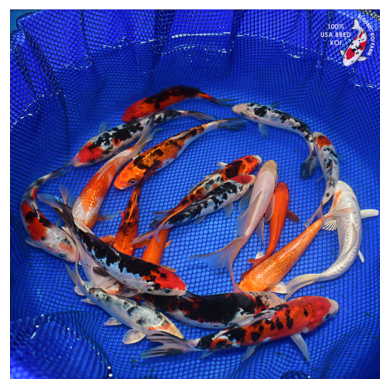

(3) 8-10" Butterfly Koi Pond Pack #L2868(X27)
d31a1d
8-10"


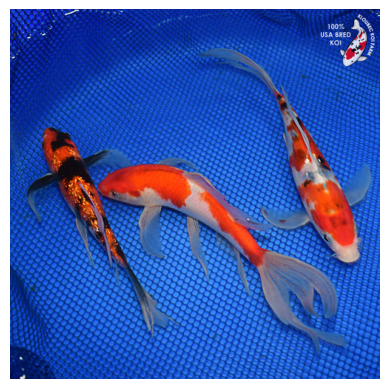

(5) 8-10" Koi Pond Pack #L2843(X25)
fb2371
8-10"


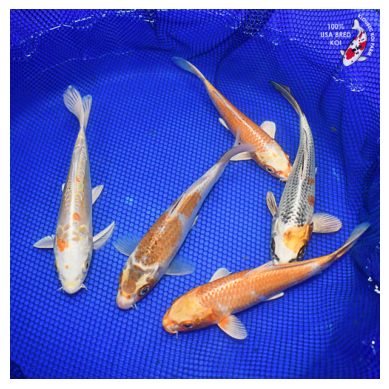

(10) 8-10" Butterfly Koi Pond Pack #L2811(X14)
f01c96
8-10"


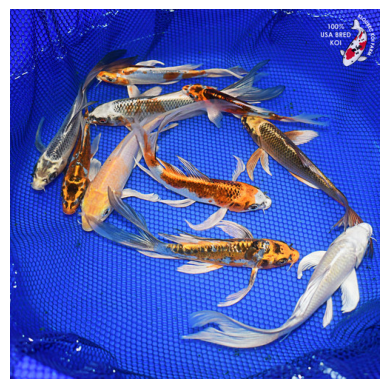

(10) 6-8" Koi Pond Pack #L2798(X12)
f9f521
6-8"


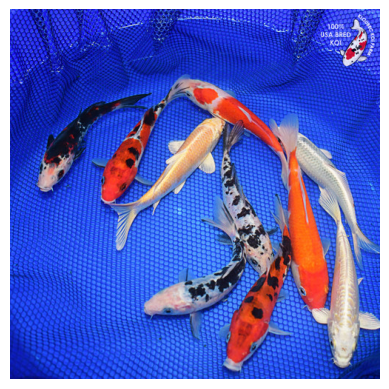

(10) 6-8" Koi Pond Pack #L2789(X3)
61a40a
6-8"


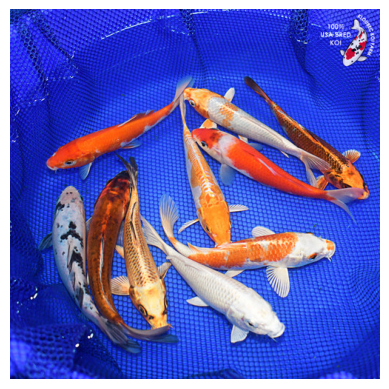

(5) 5-6" Koi Pond Pack #J182516(X70)
aa1cbb
5-6"


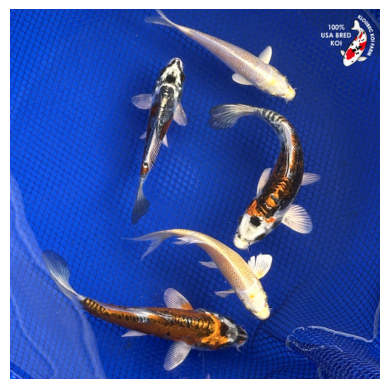

In [488]:

for index, row in kloubec[kloubec['length_inches'].str.contains('-')].iterrows():
  image_path = '../pictures/' + row['image_path']
  img = mpimg.imread(image_path)
  print(row['title'])
  print(row['uuid'])
  print(row['length_inches'])
  plt.imshow(img)
  plt.axis('off')
  plt.show()

In [489]:
# the website uses "Pack" for groups of fish, check for the title containing word "Pack"

kloubec[kloubec['title'].str.contains('Pack')]

,uuid,link,title,price,sku,image_path,image_url,length_inches,tags
29,af201b,https://www.kloubeckoi.com/10-4-5-pond-pack-ko...,"(10) 4-5"" Pond Pack Koi #L3847(G10)",399.99,22826,kloubec_data/af201b_(10)_4-5_Pond_Pack_Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"4-5""","[Pond, Pack]"
30,99b221,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3833(G8)",249.99,22824,kloubec_data/99b221_(5)_5-6_Pond_Pack_Koi_#L38...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
31,8b3ae0,https://www.kloubeckoi.com/5-5-pond-pack-koi-l...,"(5) 5"" Pond Pack Koi #L3816(G5)",249.99,22821,kloubec_data/8b3ae0_(5)_5_Pond_Pack_Koi_#L3816...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5""","[Pond, Pack]"
32,2fb1f7,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3807(G3)",249.99,22819,kloubec_data/2fb1f7_(5)_5-6_Pond_Pack_Koi_#L38...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
48,37c2a8,https://www.kloubeckoi.com/3-5-6-best-buds-hik...,"(3) 5-6"" ""Best Buds"" Hikari Koi Pond Pack #J41...",249.99,22764,kloubec_data/37c2a8_(3)_5-6_Best_Buds_Hikari_K...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Buds"", Hikari, Pond, Pack]"
51,420d00,https://www.kloubeckoi.com/3-6-8-fab-three-koi...,"(3) 6-8"" ""Fab Three"" Koi Pond Pack #J4185(J1)",349.99,22758,kloubec_data/420d00_(3)_6-8_Fab_Three_Koi_Pond...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"6-8""","[Three"", Pond, Pack]"
156,fdd2b2,https://www.kloubeckoi.com/10-5-6-pond-pack-ko...,"(10) 5-6"" Pond Pack Koi #L3615(H11)",399.99,22538,kloubec_data/fdd2b2_(10)_5-6_Pond_Pack__Koi_#L...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
157,f2704a,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3595(H8)",249.99,22535,kloubec_data/f2704a_(5)_5-6_Pond_Pack__Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
158,5f8152,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3587(H6)",249.99,22533,kloubec_data/5f8152_(5)_5-6_Pond_Pack__Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"
159,89483e,https://www.kloubeckoi.com/5-5-6-pond-pack-koi...,"(5) 5-6"" Pond Pack Koi #L3572(H3)",249.99,22530,kloubec_data/89483e_(5)_5-6_Pond_Pack__Koi_#L3...,https://cdn11.bigcommerce.com/s-c81ee/images/s...,"5-6""","[Pond, Pack]"


In [490]:
# create new column in kloubec for "multiple_fish", where it is True if the length is a range or if the title contains "Pack"

def kloubec_multiple_fish(row):
  if isinstance(row['length_inches'], str) and '-' in row['length_inches']:
    return True
  elif isinstance(row['title'], str) and 'Pack' in row['title']:
    return True
  else:
    return False

In [491]:
# apply the function to the kloubec dataframe

kloubec['multiple_fish'] = kloubec.apply(kloubec_multiple_fish, axis=1)

kloubec['multiple_fish'].value_counts()

multiple_fish
False    488
True      29
Name: count, dtype: int64

### Datasets that still do not have "multiple_fish" feature: nextdaykoi, sacramentokoi

In [492]:
# check nextdaykoi for how to discern multiple fish

for index, row in nextdaykoi.head(30).iterrows():
  print(row['category'])

['Asagi and Shusui', 'Imported Koi', 'Koi', 'Shusui', 'Single Fish', 'Single Koi']
['Gosanke', 'Imported Koi', 'Kohaku', 'Koi', 'Single Fish', 'Single Koi']
['All Hikari Koi', 'Hariwake', 'Hikarimoyo', 'Imported Koi', 'Koi', 'Single Fish', 'Single Koi']
['Aka Bekko', 'Bekko', 'Imported Koi', 'Koi', 'Single Fish', 'Single Koi']
['All Hikari Koi', 'Hariwake', 'Hikarimoyo', 'Imported Koi', 'Koi', 'Single Fish', 'Single Koi']
['All Hikari Koi', 'Hariwake', 'Hikarimoyo', 'Imported Koi', 'Koi', 'Single Fish', 'Single Koi']
['Bekko', 'Imported Koi', 'Koi', 'Shiro Bekko', 'Single Fish', 'Single Koi']
['All Hikari Koi', 'Hikarimoyo', 'Imported Koi', 'Kikusui', 'Koi', 'Single Fish', 'Single Koi']
['Hikarimoyo', 'Imported Koi', 'Koi', 'Kujaku', 'Single Fish', 'Single Koi']
['EFP Goldfish Lots', 'Goldfish For Sale', 'Imported Goldfish', 'Oranda']
['EFP Goldfish Lots', 'Goldfish For Sale', 'Imported Goldfish', 'Oranda']
['EFP Goldfish Lots', 'Goldfish For Sale', 'Imported Goldfish', 'Oranda']
['EFP

- it looks like all single fish will have the word "Single" in one of the strings inside of the category feature

In [493]:
# double check that the category is a list or string

type(nextdaykoi['category'][0])

str

In [494]:
nextdaykoi['category'][0]

"['Asagi and Shusui', 'Imported Koi', 'Koi', 'Shusui', 'Single Fish', 'Single Koi']"

In [495]:
# check if any of the strings inside of category contain the word 'Single' to fill in multiple_fish

sample_string = nextdaykoi['category'][0]

nextdaykoi['multiple_fish'] = ~nextdaykoi['category'].str.contains('Single')

In [496]:
# check the value counts of the new feature

nextdaykoi['multiple_fish'].value_counts()

multiple_fish
False    1871
True       77
Name: count, dtype: int64

### Datasets that still do not have "multiple_fish" feature: sacramentokoi

In [497]:
# see how to extract multiple_fish from sacramentokoi
# check if the length_inches if a range

sacramentokoi['length_inches'].str.contains('-').sum()

0

In [498]:
# check if there are any nulls

sacramentokoi['length_inches'].isna().sum()

np.int64(1)

In [499]:
# check the null observation

null_length = sacramentokoi[sacramentokoi['length_inches'].isna()]
null_length

,uuid,link,title,category,out_of_stock,price,sku,image_path,image_url,tags_from_title,tags_from_category,tags,gender,length_inches
422,9a51ec,https://sacramentokoi.com/koi-pre-order-product/,Koi Pre-Order,Koi,False,$100.00,NaN,sacramentokoi_data/9a51ec_Koi_Pre-Order.jpg,https://sacramentokoi.com/wp-content/uploads/2...,None,[],NaN,None,None


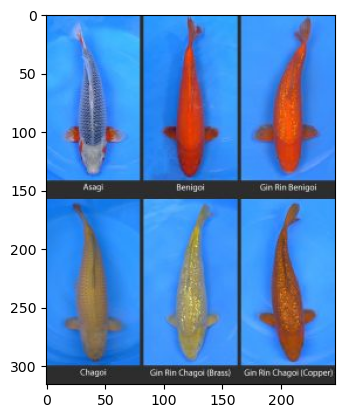

In [500]:
# visually check the image belonging to the null observation

image_path = '../pictures/' + null_length['image_path'].values[0]
image = mpimg.imread(image_path)
plt.imshow(image)
plt.show()

- the image with null in "length_inches" is of multiple fish
- from visual inspection of other pictures in sacramentokoi file folder, everything else is of single fish

In [501]:
# create a new column for multiple_fish with all observations False except for the above noted observation

sacramentokoi['multiple_fish'] = sacramentokoi['length_inches'].isna()
sacramentokoi['multiple_fish'].value_counts()

multiple_fish
False    422
True       1
Name: count, dtype: int64

In [502]:
# create info dfs for all the dataframes again

champkoi_info = info_to_df(champkoi, 'champkoi')
gckoi_info = info_to_df(gckoi, 'gckoi')
grandkoi_info = info_to_df(grandkoi, 'grandkoi')
kloubec_info = info_to_df(kloubec, 'kloubec')
nextdaykoi_info = info_to_df(nextdaykoi, 'nextdaykoi')
sacramentokoi_info = info_to_df(sacramentokoi, 'sacramentokoi')

In [503]:
# outer merge all the dataframes together again

df = pd.merge(champkoi_info, gckoi_info, on='Columns', how='outer')
df = pd.merge(df, grandkoi_info, on='Columns', how='outer')
df = pd.merge(df, kloubec_info, on='Columns', how='outer')
df = pd.merge(df, nextdaykoi_info, on='Columns', how='outer')
df = pd.merge(df, sacramentokoi_info, on='Columns', how='outer')
df

,Columns,Non-Null_champkoi,Non-Null_gckoi,Non-Null_grandkoi,Non-Null_kloubec,Non-Null_nextdaykoi,Non-Null_sacramentokoi
0,age,NaN,402.0,NaN,NaN,NaN,NaN
1,breeder,35.0,402.0,361.0,NaN,NaN,NaN
2,category,185.0,30.0,NaN,NaN,1948.0,423.0
3,certificate,NaN,402.0,NaN,NaN,NaN,NaN
4,cleaned_strings,185.0,NaN,NaN,NaN,NaN,NaN
5,description,NaN,402.0,NaN,NaN,NaN,NaN
6,details,NaN,NaN,363.0,NaN,NaN,NaN
7,gender,33.0,402.0,NaN,NaN,149.0,156.0
8,gpt_dict,NaN,408.0,NaN,NaN,NaN,NaN
9,image_path,185.0,408.0,363.0,517.0,1948.0,423.0


In [504]:
# calculate the total number of non-null values for each feature to determine which features have the most data

df['total'] = df.iloc[:, 1:7].sum(axis=1)
df.sort_values(by='total', ascending=False)

,Columns,Non-Null_champkoi,Non-Null_gckoi,Non-Null_grandkoi,Non-Null_kloubec,Non-Null_nextdaykoi,Non-Null_sacramentokoi,total
9,image_path,185.0,408.0,363.0,517.0,1948.0,423.0,3844.0
10,image_url,185.0,408.0,363.0,517.0,1948.0,423.0,3844.0
25,uuid,185.0,408.0,363.0,517.0,1948.0,423.0,3844.0
24,title,185.0,408.0,363.0,517.0,1948.0,423.0,3844.0
14,link,185.0,408.0,363.0,517.0,1948.0,423.0,3844.0
20,tags,185.0,408.0,363.0,517.0,1948.0,422.0,3843.0
15,multiple_fish,185.0,402.0,363.0,517.0,1948.0,423.0,3838.0
17,price,185.0,408.0,342.0,517.0,1948.0,423.0,3823.0
18,sku,185.0,408.0,363.0,517.0,1910.0,422.0,3805.0
13,length_inches,35.0,402.0,361.0,517.0,1903.0,422.0,3640.0


# Merging all the dataframes together

In [505]:
# in each dataframe, create a new source feature that contains the source name

champkoi['source'] = 'champkoi'
gckoi['source'] = 'gckoi'
grandkoi['source'] = 'grandkoi'
kloubec['source'] = 'kloubec'
nextdaykoi['source'] = 'nextdaykoi'
sacramentokoi['source'] = 'sacramentokoi'

In [506]:
# get a list of all column names

all_columns = df['Columns'].values
all_columns

array(['age', 'breeder', 'category', 'certificate', 'cleaned_strings',
       'description', 'details', 'gender', 'gpt_dict', 'image_path',
       'image_url', 'in_stock', 'length_cm', 'length_inches', 'link',
       'multiple_fish', 'out_of_stock', 'price', 'sku', 'split', 'tags',
       'tags_from_category', 'tags_from_title', 'tags_list', 'title',
       'uuid', 'variety'], dtype=object)

In [507]:
# create a an empty dataframe with all the possible columns

df_merged = pd.DataFrame(columns=all_columns)
df_merged

,age,breeder,category,certificate,cleaned_strings,description,details,gender,gpt_dict,image_path,...,price,sku,split,tags,tags_from_category,tags_from_title,tags_list,title,uuid,variety


In [508]:
# concat the dataframes

df_merged = pd.concat([df_merged, champkoi, gckoi, grandkoi, kloubec, nextdaykoi, sacramentokoi], ignore_index=True)
df_merged

,age,breeder,category,certificate,cleaned_strings,description,details,gender,gpt_dict,image_path,...,sku,split,tags,tags_from_category,tags_from_title,tags_list,title,uuid,variety,source
0,NaN,Isa,Group_Koi,NaN,"[14"", (36cm), Female, Showa, [Isa], 2025WINTER...",NaN,NaN,Female,NaN,champkoi_data/87e22e_A_14_(36cm)_Female_Showa_...,...,9689837273400,"[A:, 14"", (36cm), Female, Showa, [Isa], —, 202...",['Showa'],NaN,NaN,[Showa],"A: 14"" (36cm) Female Showa [Isa] — 2025WINTER-012",87e22e,"A: 14"" (36cm) Female Showa [Isa]",champkoi
1,NaN,Isa,Group_Koi,NaN,"[14"", (36cm), Male, Showa, [Isa], 2025WINTER-014]",NaN,NaN,Male,NaN,champkoi_data/188b5a_A_14_(36cm)_Male_Showa_[I...,...,9689846350136,"[A:, 14"", (36cm), Male, Showa, [Isa], —, 2025W...",['Showa'],NaN,NaN,[Showa],"A: 14"" (36cm) Male Showa [Isa] — 2025WINTER-014",188b5a,"A: 14"" (36cm) Male Showa [Isa]",champkoi
2,NaN,Isa,Group_Koi,NaN,"[13"", (33cm), Male, Showa, [Isa], 2025WINTER-015]",NaN,NaN,Male,NaN,champkoi_data/911317_A_13_(33cm)_Male_Showa_[I...,...,9689850118456,"[A:, 13"", (33cm), Male, Showa, [Isa], —, 2025W...",['Showa'],NaN,NaN,[Showa],"A: 13"" (33cm) Male Showa [Isa] — 2025WINTER-015",911317,"A: 13"" (33cm) Male Showa [Isa]",champkoi
3,NaN,Isa,Group_Koi,NaN,"[14"", (36cm), Female, Showa, [Isa], 2025WINTER...",NaN,NaN,Female,NaN,champkoi_data/dd27e7_A_14_(36cm)_Female_Showa_...,...,9689853329720,"[A:, 14"", (36cm), Female, Showa, [Isa], —, 202...",['Showa'],NaN,NaN,[Showa],"A: 14"" (36cm) Female Showa [Isa] — 2025WINTER-016",dd27e7,"A: 14"" (36cm) Female Showa [Isa]",champkoi
4,NaN,Marusaka,Group_Koi,NaN,"[14"", (36cm), Male, Kohaku, [Marusaka], 2025WI...",NaN,NaN,Male,NaN,champkoi_data/de2cb4_A_14_(36cm)_Male_Kohaku_[...,...,9689970475320,"[A:, 14"", (36cm), Male, Kohaku, [Marusaka], —,...","['Kohaku', 'Shiro Utsuri', 'Shusui']",NaN,NaN,"[Kohaku, Shiro Utsuri, Shusui]","A: 14"" (36cm) Male Kohaku [Marusaka] — 2025WIN...",de2cb4,"A: 14"" (36cm) Male Kohaku [Marusaka]",champkoi
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3839,NaN,NaN,Aokiya,NaN,NaN,NaN,NaN,None,NaN,sacramentokoi_data/e04f2c_Yellow_Dragon_17″_–_...,...,240154405.0,NaN,"[Yellow, Dragon, Aokiya]",[Aokiya],"[Yellow, Dragon]",NaN,Yellow Dragon 17″ – 240154405,e04f2c,NaN,sacramentokoi
3840,NaN,NaN,Ginga,NaN,NaN,NaN,NaN,None,NaN,sacramentokoi_data/754a14_Yellow_Ginga_14″_–_2...,...,240054090.0,NaN,"[Yellow, Ginga]",[],"[Yellow, Ginga]",NaN,Yellow Ginga 14″ – 240054090,754a14,NaN,sacramentokoi
3841,NaN,NaN,Ginga,NaN,NaN,NaN,NaN,None,NaN,sacramentokoi_data/1cb46d_Yellow_Ginga_19″_–_2...,...,240489285.0,NaN,"[Yellow, Ginga]",[],"[Yellow, Ginga]",NaN,Yellow Ginga 19″ – 240489285,1cb46d,NaN,sacramentokoi
3842,NaN,NaN,Female,NaN,NaN,NaN,NaN,Female,NaN,sacramentokoi_data/ba392c_Yellow_Ginga_20″_–_2...,...,240290281.0,NaN,"[Yellow, Ginga]",[],"[Yellow, Ginga]",NaN,Yellow Ginga 20″ – 240290281,ba392c,NaN,sacramentokoi


In [511]:
# export the merged data

# 1) to csv (lists will be turned into strings)
df_merged.to_csv('data/merged_df.csv', index=False)

# 2) to JSON (keeps list)
with open('data/merged_df.json', 'w') as f:
  json.dump(df_merged.to_dict(orient='records'), f)